# FO - Projekt 2
## Zbiór Mandelbrota a odwzorowanie logistyczne

*Autorzy: Jakub Bąba (325146), Maksymilian Nowak (325202)*

Import potrzebnych bibiliotek:

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from IPython.display import HTML

## Odwzorowanie logistyczne

Odwzorowanie logistyczne jest jednym z prostszych modeli matematycznych opisujących zmianę populacji w czasie. Model ten zakłada, że populacja rośnie w tempie proporcjonalnym do swojej wielkości, ale z ograniczeniem, że nie może przekroczyć pewnej wartości.

### Wzór

$$x_{n+1}=r\cdot x_n\cdot\left(1-x_n\right)$$

gdzie $x_n$ to wskaźnik proprcji populacji w n-tym kroku, a $r$ to parametr określający tempo wzrostu populacji.

In [24]:
from logistic_map import logistic_map

In [25]:
logistic_map??

Signature: logistic_map(r, x)
Docstring: <no docstring>
Source:   
def logistic_map(r, x):
    return r * x * (1 - x)
File:      ~/MandelbrotLogisticMap/logistic_map.py
Type:      function

## Zależność między $x_n$ a $x_{n+1}$

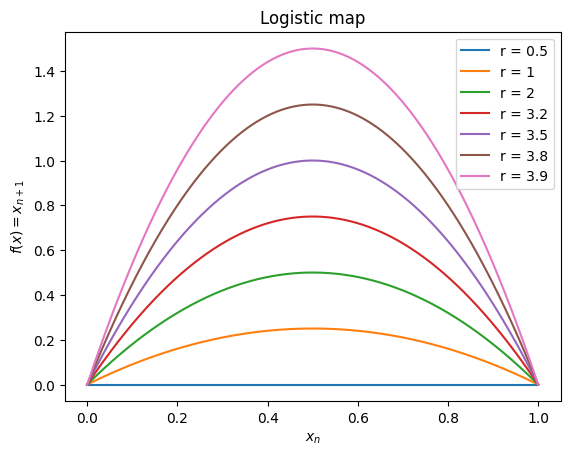

In [26]:
r = [0.5, 1, 2, 3.2, 3.5, 3.8, 3.9]
x = np.linspace(0, 1, 1000)
plt.figure()
for r_i in range(len(r)):
    y = logistic_map(r_i, x)
    plt.plot(x, y)
plt.xlabel('$x_n$')
plt.ylabel('$f(x) = x_{n+1}$')
plt.title('Logistic map')
plt.legend(['r = 0.5', 'r = 1', 'r = 2', 'r = 3.2', 'r = 3.5', 'r = 3.8', 'r = 3.9'])
plt.show()

Wniosek: Zmiana wartości $x_n$ między krokami jest zależna od wartości $r$.
Dodatkowo, wykres $x_{n+1}$ w zależności od $x_n$ ma kształt odwróconej paraboli.

## Diagram bifurkacji mapy logistycznej

### Co to jest diagram bifurkacji

Jest to wykres pokazujący zmianę wartości, do których zbiega populacja $x_n$ w zależności od wartości parametru $r$.

### Implementacja

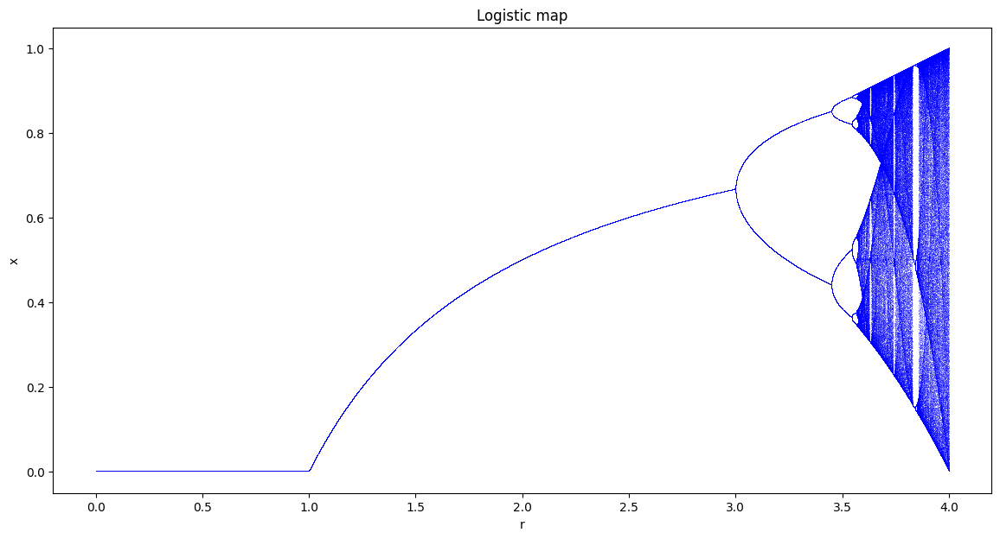

In [27]:
r_min = 0 
r_max = 4.0
r_steps = 25000

n = 1000
last = 100

r_values = np.linspace(r_min, r_max, r_steps)
x_values = 0.5 * np.ones((r_steps))

bifurcation_diagram = []

for i in range(n):
    x_values = logistic_map(r_values, x_values)
    if i >= (n - last):
        bifurcation_diagram.append(x_values)

plt.figure(figsize=(14, 7))
plt.plot(r_values, np.array(bifurcation_diagram).T, ',b', alpha=0.25)
plt.xlabel('r')
plt.ylabel('x')
plt.title('Logistic map')
plt.show()

#### Zbliżenie na chaos

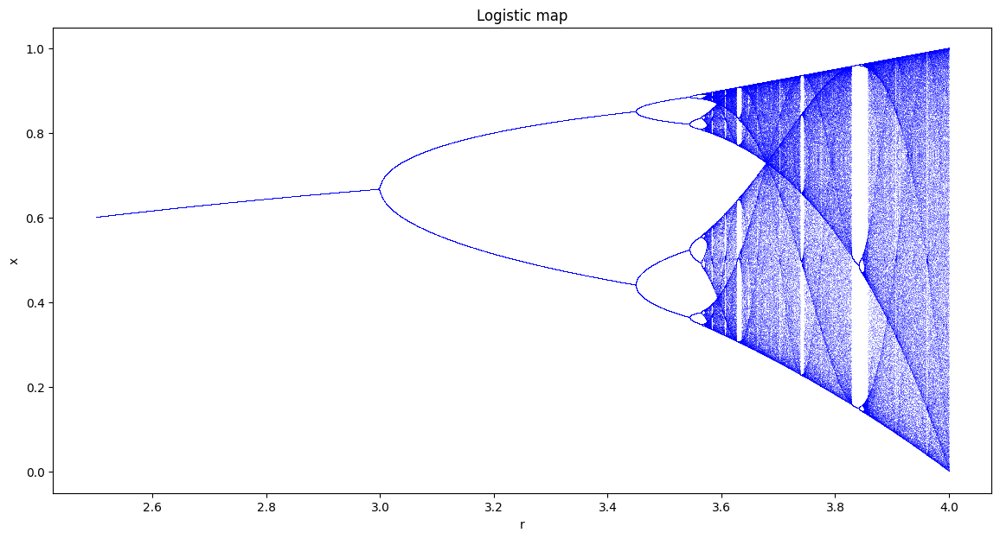

In [28]:
r_min = 2.5 
r_max = 4.0
r_steps = 10000

n = 1000
last = 100

r_values = np.linspace(r_min, r_max, r_steps)
x_values = 0.5 * np.ones((r_steps))

bifurcation_diagram = []

for i in range(n):
    x_values = logistic_map(r_values, x_values)
    if i >= (n - last):
        bifurcation_diagram.append(x_values)

plt.figure(figsize=(14, 7))
plt.plot(r_values, np.array(bifurcation_diagram).T, ',b', alpha=0.25)
plt.xlabel('r')
plt.ylabel('x')
plt.title('Logistic map')
plt.show()

### Wnioski

- Do $r=3$ populacja zbiega do jednej wartości, stopniowo rosnącej.
- Dla $r\in(3,3.45)$ populacja zaczyna oscylować między dwoma wartościami.
- Do ok. $r=3.57$ populacja zbiega do coraz większej liczby wartości (4, 8, 16, 32, ...).
- Od $r=3.57$ populacja wpada w chaos.
- Dla $r\approx3.83$ populacja stabilizuje się, oscyulując między 3 wartościami.
- Następnie populacja oscyluje w 6, 12, 24, ... wartościach.
- Dla $r\approx3.85$ populacja ponowanie wpada w chaos.
- Dla $r>4$ następuje tzw. kryzys, w którym populacja zbiega do $-\infty$.

## Zmiana wartości szeregu $x$ w zależności od współczynnika $r$

Animacja została wykonana za pomocą `matplotlib.animation`.

In [29]:
r = np.concatenate((np.linspace(0.0, 3.5, 75), np.linspace(3.5, 4.0, 275)))

fig, ax = plt.subplots()
plt.ioff()

def update(r):
    x = 0.5
    n = 50
    x_values = np.zeros(n)
    x_values[0] = x
    for i in range(1, n):
        x = logistic_map(r, x)
        x_values[i] = x
    ax.clear()
    ax.scatter(np.arange(n), x_values, c='b', s=2)
    ax.plot(np.arange(n), x_values, c='black', alpha=0.5)
    ax.set_xlabel('n')
    ax.set_ylabel('x')
    ax.set_title(f'r = {r}')
    ax.set_xlim(0, n)
    ax.set_ylim(0, 1)
    return ax

ani = animation.FuncAnimation(fig, update, frames=r, repeat=False)
plt.close()
ani.save('logistic_map.gif', writer='pillow', fps=20)
HTML(ani.to_jshtml())

# Zbiór Mandelbrota
Zbiór Mandelbrota to podzbiór płaszczyzny zespolonej, który zależy od poniższych równań:
$$
z_{n+1} = z_n^2 + c
$$
$$
z_{0} = 0
$$

Wartość $c$ to punkt na wykresie, na płaszczyźnie zespolonej. Jeżeli wartość $z_{n}$ będą ograniczone, to punkt należy do zbioru Mandelbrota, a jeśli nie, to punkt nie należy do tego zbioru.

Poniżej znajduje się kod oraz wygenerowany zbiór Mandelbrota, w którym wartości należące do zbioru są oznaczone kolorem żółtym, a nienależące fioletowym.

In [30]:
def generate_population(xmin=-2, xmax=1, ymin=-1.5, ymax=1.5, xres=3000, yres=3000):
    re = np.linspace(xmin, xmax, xres)
    im = np.linspace(ymin, ymax, yres)
    return re[np.newaxis, :] + 1j * im[:, np.newaxis]


def mandelbrot(c, max_iter=100):
    z = 0
    for _ in range(max_iter):
        z = z ** 2 + c
    return abs(z) < 2

/tmp/ipykernel_13843/1371155557.py:10: RuntimeWarning: overflow encountered in scalar power
  z = z ** 2 + c
/tmp/ipykernel_13843/1371155557.py:10: RuntimeWarning: invalid value encountered in scalar power
  z = z ** 2 + c


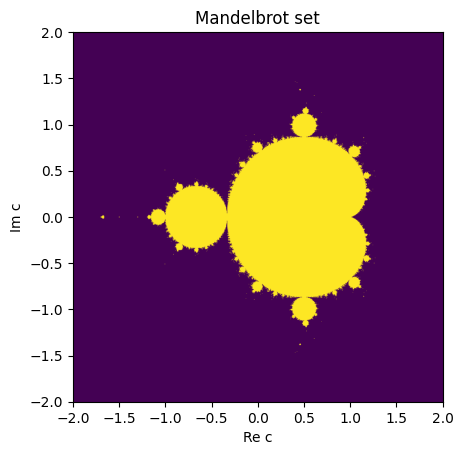

In [31]:
def plot_mandelbrot_set():
    plt.figure()
    population = generate_population(xres=1000, yres=1000)
    mandelbrot_set = np.zeros(population.shape, dtype=bool)
    for i in range(population.shape[0]):
        for j in range(population.shape[1]):
            mandelbrot_set[i, j] = mandelbrot(population[i, j])

    plt.imshow(mandelbrot_set, extent=[-2, 2, -2, 2])
    plt.xlabel('Re c')
    plt.ylabel('Im c')
    plt.title('Mandelbrot set')
    plt.savefig('mandelbrot_set.png', dpi=300)
    plt.show()

plot_mandelbrot_set()

## Oscylacje w zbiorze Mandelbrota
Wartości z $n$ zmierzającym do nieskończoności mogą:
- Zmierzać do jednej wartości
- Oscylować wokół kilku wartości
- Zmieniać się chaotycznie lub zmierzać do nieskończoności

Postanowiliśmy zobaczyć, jak wygląda to w różnych miejscach naszego zbioru:

In [32]:
def stabilized_values(c, max_iter=5000, tolerance=1e-6):
    z = 0
    unique = []
    for _ in range(max_iter):
        z = z ** 2 + c
        if abs(z) > 2:
            return []

    for _ in range(10):
        z = z ** 2 + c
        if all(abs(z - u) > tolerance for u in unique):
            unique.append(z)

    return unique

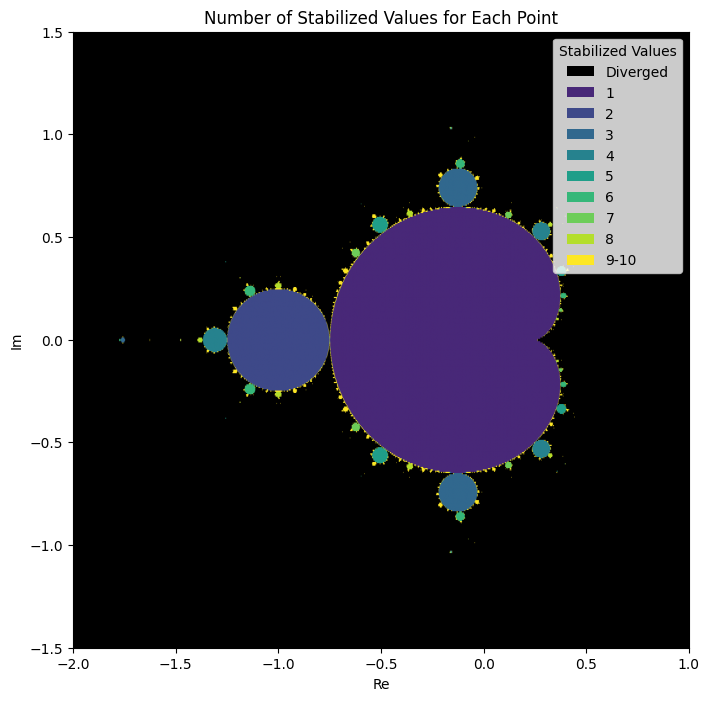

In [33]:
def plot_stabilized_values():
    cmap = ListedColormap([
        'black',
        '#482878',
        '#3E4989',
        '#31688E',
        '#26828E',
        '#1F9E89',
        '#35B779',
        '#6DCD59',
        '#B4DE2C',
        '#FDE725'
    ])
    norm = plt.Normalize(vmin=-1, vmax=10)

    population = generate_population(xres=2000, yres=500)
    num_stabilized = np.zeros(population.shape, dtype=int)

    for i in range(population.shape[0]):
        for j in range(population.shape[1]):
            num_stabilized[i, j] = len(stabilized_values(population[i, j]))

    plt.figure(figsize=(8, 8))
    plt.imshow(np.clip(num_stabilized, -1, 10), extent=[-2, 1, -1.5, 1.5], cmap=cmap, norm=norm)
    plt.xlabel('Re')
    plt.ylabel('Im')
    plt.title('Number of Stabilized Values for Each Point')

    legend_elements = [
        Patch(facecolor='black', label='Diverged'),
        Patch(facecolor='#482878', label='1'),
        Patch(facecolor='#3E4989', label='2'),
        Patch(facecolor='#31688E', label='3'),
        Patch(facecolor='#26828E', label='4'),
        Patch(facecolor='#1F9E89', label='5'),
        Patch(facecolor='#35B779', label='6'),
        Patch(facecolor='#6DCD59', label='7'),
        Patch(facecolor='#B4DE2C', label='8'),
        Patch(facecolor='#FDE725', label='9-10'),
    ]
    plt.legend(handles=legend_elements, loc='upper right', title='Stabilized Values')

    plt.savefig('stabilized_values.png', dpi=300)
    plt.show()


plot_stabilized_values()

Na powyższym wykresie możemy zobaczyć różne części przestrzeni, w których ilość ustabilizowanych wartości wynosi 1, 2, 3, i tak dalej.

Skupiliśmy się następnie na prostej $\Im(z)=2$